In [1]:
import matplotlib.pyplot as plt
import numpy as np
import torch
import seaborn as sns
from matplotlib import axes
import os 
from glob import glob
import pandas as pd
import json
import sys, os
# sys.path.append('/cluster/home/kamara/GInX-Eval')
os.getcwd()
sns.set()

In [2]:
pal = sns.color_palette("Paired", 15)
pal_dataset = sns.color_palette("Dark2")#sns.color_palette("tab10")
dict_marker = {"non-generative":"o", "generative":"X"}
dict_names = {"random": 'Random', "sa":'Saliency', "ig": "IntegratedGrad", "gradcam": 'GradCAM', "occlusion": 'Occlusion',
              "basic_gnnexplainer": 'GNNExplainer', "gnnexplainer": 'GNNExplainer(E,NF)', 'gsat_active':'GSAT_Active',
              "pgmexplainer": 'PGMExplainer', "subgraphx": 'SubgraphX', "pgexplainer": 'PGExplainer', "graphcfe": "GraphCFE", "gflowexplainer": "GFlowExplainer", "rcexplainer": "RCExplainer", "gsat": "GSAT", "diffexplainer": "D4Explainer", "inverse": "Inverse", "truth": "Truth"}
dict_dataset = {'ba_2motifs':'BA-2Motifs', 'ieee24':'IEEE24', 'ieee39':'IEEE39', 'ieee118':'IEEE118', 'uk': 'UK'}

dict_color = {"Random":'black', "Distance":pal[1], "PageRank":pal[2], "Saliency": 'olivedrab', "IntegratedGrad": 'forestgreen', "GradCAM": "yellowgreen", "Occlusion":'peru', 
              "GNNExplainer": pal[7], "GNNExplainer(E,NF)": 'orangered', 
              "PGMExplainer":'firebrick', "SubgraphX": "gold", "PGExplainer": 'orchid', "GraphCFE": "darkviolet", "GFlowExplainer": 'lightblue', "RCExplainer":'mediumpurple', "GSAT": "slategrey", "D4Explainer": "darkblue", "Inverse": "dodgerblue", "Truth": pal[5]}
dict_color_dataset = {'BA-2Motifs':pal_dataset[0], "IEEE24":pal_dataset[1], "IEEE39":pal_dataset[2], "IEEE118":pal_dataset[3], "UK":pal_dataset[4]}
old_dict_color = {"Random":'black', "Distance":pal[1], "PageRank":pal[2], "Saliency": pal[3], "IntegratedGrad": 'hotpink', "GradCAM": "firebrick", "Occlusion":'peru', 
              "GNNExplainer": pal[7], "GNNExplainer(E,NF)": 'mediumblue', 
              "PGMExplainer":pal[9], "SubgraphX": "gold", "PGExplainer": 'lightsalmon', "GraphCFE": "darkviolet", "GFlowExplainer": 'forestgreen', "RCExplainer":'yellowgreen', "GSAT": "gray", "D4Explainer": "cadetblue", "Inverse": "dodgerblue", "Truth": pal[5]}

nongen_order = {"Occlusion":0, "Saliency":1, "IntegratedGrad":2, "GradCAM":3,  "SubgraphX":4, "GNNExplainer":5, "GNNExplainer(E,NF)":6,
              "PGMExplainer":7}
gen_order = {"PGExplainer":8, "GraphCFE":9, "RCExplainer":10, "D4Explainer":11, "GSAT":12, "GFlowExplainer":13}

small_explainer_set = ['Truth', 'Random', 'Inverse', 'GradCAM', 'Integrated Gradient', 'Occlusion', 'GNNExplainer', 'PGMExplainer', 'PGExplainer', 'GSAT', 'RCExplainer', 'D4Explainer']

plt.rcParams['figure.dpi'] = 600
plt.rcParams['savefig.dpi'] = 600

In [3]:
def explainer_type(row):
    if row['explainer'] in ['gnnexplainer', 'pgmexplainer', 'pgexplainer', 'occlusion', 'subgraphx'] :
      return('pertubation')
    elif row['explainer'] in ['sa', 'ig'] :
      return('gradient')
    elif row['explainer'] in ['rcexplainer'] :
      return('reinforcement learning')
    elif row['explainer'] in ['cfgnnexplainer', 'graphcfe', 'gflowexplainer'] :
      return('counterfactual')
    return('baseline')

def explainer_generation(row):
    if row['explainer'] in ['cfgnnexplainer', 'graphcfe', 'gflowexplainer', 'rcexplainer', 'gsat', 'diffexplainer', 'pgexplainer'] :
      return('generative')
    elif row['explainer'] in ['truth', 'inverse', 'random'] :
      return('baseline')
    else:
      return('non-generative')

def explainer_generation_str(row):
    if row in ['cfgnnexplainer', 'graphcfe', 'gflowexplainer', 'rcexplainer', 'gsat', 'diffexplainer', 'pgexplainer'] :
      return('generative')
    elif row in ['truth', 'inverse', 'random'] :
      return('baseline')
    else:
      return('non-generative')

## Accuracy

In [4]:
import os
from glob import glob

PATH = '/cluster/work/zhang/kamara/powergraph_storage/results'
EXT = "*.csv"

all_csv_files = []
for path, subdir, files in os.walk(PATH):
    for file in glob(os.path.join(path, EXT)):
        filename = os.path.basename(file)
        all_csv_files.append(file)

list_dfs = []
for f in all_csv_files:
    print(f)
    df_init = pd.read_csv(f, index_col=False)
    # Check if the DataFrame has an unnamed index column
    if df_init.columns[0].startswith('Unnamed:'):
        # Delete the unnamed index column
        df_init = df_init.loc[:, ~df_init.columns.str.startswith('Unnamed:')]
    list_dfs.append(df_init)
df_init = pd.concat(list_dfs)#, ignore_index=True)
df_init['dataset'] = df_init['dataset'].replace(dict_dataset)
df_init['type'] = df_init['explainer'].apply(explainer_generation_str)
df_init['explainer'] = df_init['explainer'].replace(dict_names)

df_init

/cluster/work/zhang/kamara/powergraph_storage/results/ba_2motifs/random/results_ba_2motifs_transformer_random_phenomenon_soft_500_target0_mix_cpu_0.csv
/cluster/work/zhang/kamara/powergraph_storage/results/ba_2motifs/random/results_ba_2motifs_transformer_random_phenomenon_hard_500_target0_mix_cpu_0.csv
/cluster/work/zhang/kamara/powergraph_storage/results/ba_2motifs/truth/results_ba_2motifs_transformer_truth_phenomenon_soft_500_target0_mix_cpu_0.csv
/cluster/work/zhang/kamara/powergraph_storage/results/ba_2motifs/truth/results_ba_2motifs_transformer_truth_phenomenon_hard_500_target0_mix_cpu_0.csv
/cluster/work/zhang/kamara/powergraph_storage/results/ba_2motifs/pgmexplainer/results_ba_2motifs_transformer_pgmexplainer_phenomenon_soft_500_target0_mix_cpu_0.csv
/cluster/work/zhang/kamara/powergraph_storage/results/ba_2motifs/pgmexplainer/results_ba_2motifs_transformer_pgmexplainer_phenomenon_hard_500_target0_mix_cpu_0.csv
/cluster/work/zhang/kamara/powergraph_storage/results/ba_2motifs/sa/

,balanced_acc,dataset,device,explainer,f1_score,fidelity_acc+,fidelity_acc-,fidelity_prob+,fidelity_prob-,focus,...,task,task_target,time,top_balanced_acc,top_f1_score,top_precision,top_recall,top_roc_auc_score,topk,type
0,0.500885,BA-2Motifs,cpu,Random,0.333446,0.000000,0.000000,-0.014662,-0.014342,phenomenon,...,binary_classification,graph,0.0000,0.504819,0.217814,0.207955,0.228655,0.504572,NaN,baseline
1,0.500354,BA-2Motifs,cpu,Random,0.067692,0.000000,0.000000,-0.013971,-0.015447,phenomenon,...,binary_classification,graph,0.0000,0.500354,0.067692,0.204000,0.040582,0.500349,1.0,baseline
2,0.500398,BA-2Motifs,cpu,Random,0.093429,0.000000,0.000000,-0.016551,-0.012699,phenomenon,...,binary_classification,graph,0.0000,0.500398,0.093429,0.203333,0.060655,0.500398,2.0,baseline
3,0.501083,BA-2Motifs,cpu,Random,0.116971,0.000000,0.000000,-0.018064,-0.011405,phenomenon,...,binary_classification,graph,0.0000,0.501083,0.116971,0.205500,0.081764,0.501050,3.0,baseline
4,0.502502,BA-2Motifs,cpu,Random,0.138950,0.000000,0.000000,-0.019351,-0.010355,phenomenon,...,binary_classification,graph,0.0000,0.502502,0.138950,0.209200,0.104036,0.502377,4.0,baseline
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
18,0.410177,IEEE39,cpu,Occlusion,0.015747,0.467532,0.467532,0.345978,0.348523,phenomenon,...,multi_classification,graph,0.0927,0.481266,0.009507,0.008658,0.010552,0.480955,18.0,non-generative
19,0.415107,IEEE39,cpu,Occlusion,0.021316,0.467532,0.467532,0.346304,0.348525,phenomenon,...,multi_classification,graph,0.0927,0.481266,0.009507,0.008658,0.010552,0.480955,19.0,non-generative
20,0.414715,IEEE39,cpu,Occlusion,0.022649,0.467532,0.467532,0.346240,0.348528,phenomenon,...,multi_classification,graph,0.0927,0.481266,0.009507,0.008658,0.010552,0.480955,20.0,non-generative
21,0.405693,IEEE39,cpu,Occlusion,0.048156,0.467532,0.467532,0.348565,0.346416,phenomenon,...,multi_classification,graph,0.0927,0.482116,0.010950,0.009957,0.012175,0.481806,50.0,non-generative


In [5]:
df_init.columns

Index(['balanced_acc', 'dataset', 'device', 'explainer', 'f1_score',
       'fidelity_acc+', 'fidelity_acc-', 'fidelity_prob+', 'fidelity_prob-',
       'focus', 'mask_entropy', 'mask_nature', 'mask_size', 'mask_sparsity',
       'max_avg', 'model', 'num_explained_y_fid', 'num_explained_y_with_acc',
       'precision', 'pred_type', 'recall', 'roc_auc_score', 'seed', 'task',
       'task_target', 'time', 'top_balanced_acc', 'top_f1_score',
       'top_precision', 'top_recall', 'top_roc_auc_score', 'topk', 'type'],
      dtype='object')

In [6]:
df_soft = df_init[df_init['mask_nature'] == 'soft']
df_hard = df_init[df_init['mask_nature'] == 'hard']

### Accuracy

In [7]:
df = df_soft[df_soft.dataset.isin(['IEEE24', 'IEEE39', 'IEEE118', 'UK', 'BA-2Motifs'])] 
df = df[df.topk==10]
df

,balanced_acc,dataset,device,explainer,f1_score,fidelity_acc+,fidelity_acc-,fidelity_prob+,fidelity_prob-,focus,...,task,task_target,time,top_balanced_acc,top_f1_score,top_precision,top_recall,top_roc_auc_score,topk,type
10,0.504642,BA-2Motifs,cpu,Random,0.217221,0.000000,0.000000,-0.021285,-0.010529,phenomenon,...,binary_classification,graph,0.0000,0.504642,0.217221,0.207818,0.227564,0.504416,10.0,baseline
10,1.0,BA-2Motifs,cpu,Truth,1.000000,0.000000,0.000000,-0.011082,-0.011391,phenomenon,...,binary_classification,graph,0.0000,1.000000,1.000000,1.000000,1.000000,1.000000,10.0,baseline
10,0.474751,BA-2Motifs,cpu,PGMExplainer,0.081475,0.000000,0.000000,-0.012267,-0.009463,phenomenon,...,binary_classification,graph,2.8852,0.474751,0.081475,0.105130,0.070255,0.474657,10.0,non-generative
10,0.685754,BA-2Motifs,cpu,Saliency,0.493359,0.000000,0.000000,-0.020850,-0.013991,phenomenon,...,binary_classification,graph,0.0042,0.685754,0.493359,0.471818,0.517055,0.693221,10.0,non-generative
10,0.379209,BA-2Motifs,cpu,GradCAM,0.025567,0.000000,0.000000,-0.012687,-0.007778,phenomenon,...,binary_classification,graph,0.0086,0.379209,0.025567,0.025873,0.025764,0.379384,10.0,non-generative
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
10,0.438556,IEEE39,cpu,D4Explainer,0.004036,0.155844,0.467532,0.001706,0.158841,phenomenon,...,multi_classification,graph,11.6351,0.477831,0.003674,0.003476,0.003896,0.477840,10.0,generative
10,0.458792,IEEE39,cpu,RCExplainer,0.015980,0.149351,0.467532,0.052885,0.164844,phenomenon,...,multi_classification,graph,14.6859,0.477961,0.003885,0.003525,0.004329,0.477896,10.0,generative
10,0.457198,IEEE39,cpu,IntegratedGrad,0.025570,0.467532,0.467532,0.345547,0.296001,phenomenon,...,multi_classification,graph,0.0947,0.483006,0.012523,0.011668,0.013528,0.482594,10.0,non-generative
10,0.478235,IEEE39,cpu,SubgraphX,0.020057,0.051948,0.454545,0.035720,0.149545,phenomenon,...,multi_classification,graph,4.5552,0.488840,0.016960,0.015152,0.019481,0.488840,10.0,non-generative


In [8]:
df = df[['dataset', 'model', 'explainer', 'seed', 'top_balanced_acc', 'top_roc_auc_score', 'top_f1_score', 'balanced_acc', 'roc_auc_score', 'f1_score', 'fidelity_acc+', 'fidelity_acc-', 'fidelity_prob+', 'fidelity_prob-']]
df = df.groupby(['dataset', 'model', 'explainer']).mean().reset_index()


In [9]:
def order_by(df, metric):
    mean = df.groupby(by=['dataset', 'explainer', 'model', 'seed']).mean().reset_index()
    mean = mean.sort_values(by=metric, ascending=False)
    expl_order = mean['explainer'].tolist()
    df['explainer_rank'] = df['explainer'].apply(lambda x: expl_order.index(x))
    df = df.sort_values(by='explainer_rank', ascending=True)
    return df

/tmp/ipykernel_1924/1108326277.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['explainer_rank'] = df['explainer'].apply(lambda x: expl_order.index(x))
/tmp/ipykernel_1924/1108326277.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['explainer_rank'] = df['explainer'].apply(lambda x: expl_order.index(x))
/tmp/ipykernel_1924/1108326277.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the 

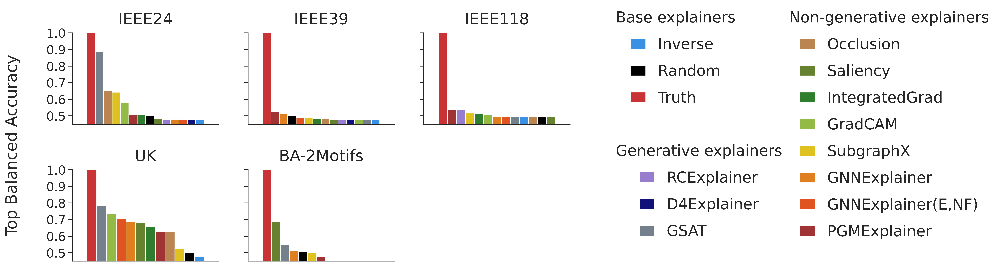

In [10]:
# Choose your metric
metric = "top_balanced_acc"


#sns.set_style("whitegrid")
sns.set_style("ticks")
sns.set_context("notebook", rc={"xtick.labelsize" : 18, "ytick.labelsize" : 18})
fonttitle = 23
fontlegend = 22
fig, ax = plt.subplots(2,3, sharex=False,sharey=True, figsize=(13,6), gridspec_kw={'hspace': 0.5})

df0 = df[(df.dataset=='IEEE24')]
df0 = order_by(df0, metric)
g0 = sns.barplot(data=df0, x="seed", y=metric,
    hue="explainer", palette=dict_color, dodge=True, errorbar='se', ax=ax[0,0])
g0.set_title('IEEE24', fontsize=fonttitle, y=1.05)
g0.set(xlabel=None, ylabel=None)
ax[0,0].legend([],[], frameon=False)
ax[0,0].set_xticks([])
ax[0,0].set_ylim(0.45,1)

df1 = df[(df.dataset=='IEEE39')]
df1 = order_by(df1, metric)
g1 = sns.barplot(data=df1, x="seed", y=metric,
    hue="explainer", palette=dict_color, dodge=True, errorbar='se', ax=ax[0,1])
g1.set_title('IEEE39', fontsize=fonttitle, y=1.05)
g1.set(xlabel=None, ylabel=None)
ax[0,1].legend([],[], frameon=False)
ax[0,1].set_xticks([])
ax[0,1].set_ylim(0.45,1)

df3 = df[(df.dataset=='UK')]
df3 = order_by(df3, metric)
g3 = sns.barplot(data=df3, x="seed", y=metric,
    hue="explainer", palette=dict_color, dodge=True, errorbar='se', ax=ax[1,0])
g3.set_title('UK', fontsize=fonttitle, y=1.05)
g3.set(xlabel=None, ylabel=None)
ax[1,0].legend([],[], frameon=False)
ax[1,0].set_xticks([])
ax[1,0].set_ylim(0.45,1)

df4 = df[(df.dataset=='BA-2Motifs')]
df4 = order_by(df4, metric)
g4 = sns.barplot(data=df4, x="seed", y=metric,
    hue="explainer", palette=dict_color, dodge=True, errorbar='se', ax=ax[1,1])
g4.set_title("BA-2Motifs", fontsize=fonttitle, y=1.05)
g4.set(xlabel=None, ylabel=None)
ax[1,1].legend([],[], frameon=False)
ax[1,1].set_xticks([])
ax[1,1].set_ylim(0.45,1)

df5 = df[(df.dataset=='IEEE118')]
df5 = order_by(df5, metric)
g5 = sns.barplot(data=df5, x="seed", y=metric,
    hue="explainer", palette=dict_color, dodge=True, errorbar='se', ax=ax[0,2])
g5.set_title("IEEE118", fontsize=fonttitle, y=1.05)
g5.set(xlabel=None, ylabel=None)
ax[0,2].legend([],[], frameon=False)
ax[0,2].set_xticks([])
ax[0,2].set_ylim(0.45,1)

# Remove the empty subplot (1, 2)
plt.delaxes(ax[1, 2])

#fig.supxlabel("Fraction of removed edges", fontsize=fonttitle, x=0.453, y=0.05)
fig.supylabel("Top Balanced Accuracy", fontsize=fonttitle)

inv_dict_names = {v: k for k, v in dict_names.items()}

labels_base, handles_base = [], []
labels_gen, handles_gen = [], []
labels_non_gen, handles_non_gen = [], []
for handle, label in zip(*ax[0,0].get_legend_handles_labels()):
  if explainer_generation_str(inv_dict_names[label])=='generative':
    labels_gen.append(label)
    handles_gen.append(handle)
  elif explainer_generation_str(inv_dict_names[label])=='baseline':
    labels_base.append(label)
    handles_base.append(handle)
  else:
    labels_non_gen.append(label)
    handles_non_gen.append(handle)

labels_base, handles_base = zip(*sorted(zip(labels_base, handles_base), key=lambda t: t[0]))

nongen_keys=dict(zip(nongen_order,range(len(nongen_order))))
labels_non_gen, handles_non_gen = zip(*sorted(zip(labels_non_gen, handles_non_gen), key=lambda t,keys=nongen_keys: keys.get(t[0],np.inf))) # sort both labels and handles by labels

gen_keys=dict(zip(gen_order,range(len(gen_order))))
labels_gen, handles_gen = zip(*sorted(zip(labels_gen, handles_gen), key=lambda t,keys=gen_keys: keys.get(t[0],np.inf)))

leg_base = fig.legend(handles_base, labels_base, loc='upper left', ncol=1, fontsize=fontlegend, bbox_to_anchor=(0.95, 1), handlelength=1, title="Base explainers", title_fontsize=fontlegend, labelspacing = 0.8, frameon=False, markerscale=1.4)
leg_gen = fig.legend(handles_gen, labels_gen, loc='upper left', ncol=1, fontsize=fontlegend, bbox_to_anchor=(0.95, 0.55), handlelength=1, title="Generative explainers", title_fontsize=fontlegend, labelspacing = 0.8, frameon=False, markerscale=1.4)
leg_non_gen = fig.legend(handles_non_gen, labels_non_gen, loc='upper left', ncol=1, fontsize=fontlegend, bbox_to_anchor=(1.22, 1), handlelength=1, title="Non-generative explainers", title_fontsize=fontlegend, labelspacing = 0.8, frameon=False, markerscale=1.4)
for line in leg_base.get_lines():
    line.set_linewidth(4.3)
for line in leg_gen.get_lines():
    line.set_linewidth(4.3)
for line in leg_non_gen.get_lines():
    line.set_linewidth(4.3)



# Set the number of y-axis ticks or use a locator
# For example, to set 6 ticks on each y-axis:
for row in ax:
    for axis in row:
        axis.yaxis.set_major_locator(plt.MaxNLocator(6))

sns.despine()
plt.tight_layout(pad=1.8)
plt.savefig('/cluster/home/kamara/PowerGraph/figures/top_balanced_acc.pdf', bbox_inches='tight')
plt.savefig('/cluster/home/kamara/PowerGraph/figures/top_balanced_acc.png', bbox_inches='tight')
plt.show()

## Soft Explanations

/tmp/ipykernel_1924/1974988469.py:103: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(pad=1.8)


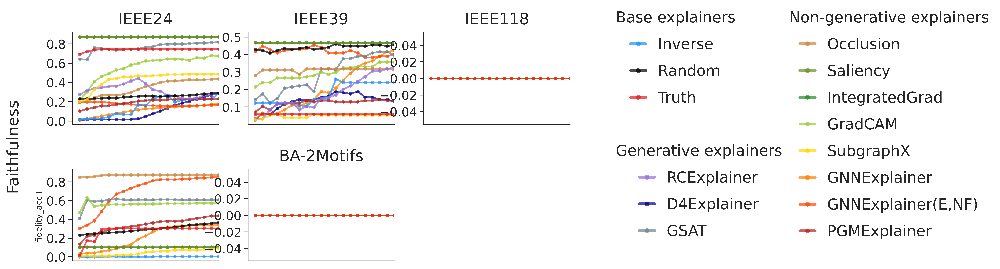

In [13]:
df = df_soft[['dataset', 'model', 'explainer', 'seed', 'topk', 'balanced_acc', 'roc_auc_score', 'f1_score', 'fidelity_acc+', 'fidelity_acc-', 'fidelity_prob+', 'fidelity_prob-']]
df = df.groupby(['model', 'dataset', 'explainer', 'topk']).mean().reset_index()
metric = "fidelity_acc+"
df[metric] = pd.to_numeric(df[metric], errors='coerce')


#sns.set_style("whitegrid")
sns.set_style("ticks")
sns.set_context("notebook", rc={"xtick.labelsize" : 18, "ytick.labelsize" : 18})
fonttitle = 23
fontlegend = 22
fig, ax = plt.subplots(2,3, sharex=True,sharey=False, figsize=(13,6), gridspec_kw={'hspace': 0.5})

g0 = sns.lineplot(data=df[df.dataset=='IEEE24'], x="topk", y=metric,
    hue="explainer", palette=dict_color, alpha=0.7, marker='o', markersize=5, markeredgewidth=0, lw=2.5, ax=ax[0,0])
g0.set_title('IEEE24', fontsize=fonttitle, y=1.05)
g0.set(xlabel=None, ylabel=None)
ax[0,0].legend([],[], frameon=False)
ax[0,0].set_xticks([])
ax[0,0].set_xlim(0,20)

g1 = sns.lineplot(data=df[df.dataset=='IEEE39'], x="topk", y=metric,
    hue="explainer", palette=dict_color, alpha=0.7, marker='o', markersize=5, markeredgewidth=0, lw=2.5, ax=ax[0,1])
g1.set_title('IEEE39', fontsize=fonttitle, y=1.05)
g1.set(xlabel=None, ylabel=None)
ax[0,1].legend([],[], frameon=False)
ax[0,1].set_xticks([])
ax[0,1].set_xlim(0,20)

g0 = sns.lineplot(data=df[df.dataset=='UK'], x="topk", y=metric,
    hue="explainer", palette=dict_color, alpha=0.7, marker='o', markersize=5, markeredgewidth=0, lw=2.5, ax=ax[1,0])
g3.set_title('UK', fontsize=fonttitle, y=1.05)
g3.set(xlabel=None, ylabel=None)
ax[1,0].legend([],[], frameon=False)
ax[1,0].set_xticks([])
ax[1,0].set_xlim(0,20)

g4 = sns.lineplot(data=df[df.dataset=='BA-2Motifs'], x="topk", y=metric,
    hue="explainer", palette=dict_color, alpha=0.7, marker='o', markersize=5, markeredgewidth=0, lw=2.5, ax=ax[1,1])
g4.set_title("BA-2Motifs", fontsize=fonttitle, y=1.05)
g4.set(xlabel=None, ylabel=None)
ax[1,1].legend([],[], frameon=False)
ax[1,1].set_xticks([])
ax[1,1].set_xlim(0,20)

g5 = sns.lineplot(data=df[df.dataset=='IEEE118'], x="topk", y=metric,
    hue="explainer", palette=dict_color, alpha=0.7, marker='o', markersize=5, markeredgewidth=0, lw=2.5, ax=ax[0,2])
g5.set_title("IEEE118", fontsize=fonttitle, y=1.05)
g5.set(xlabel=None, ylabel=None)
ax[0,2].legend([],[], frameon=False)
ax[0,2].set_xticks([])
ax[0,2].set_xlim(0,20)

# Remove the empty subplot (1, 2)
plt.delaxes(ax[1, 2])

#fig.supxlabel("Fraction of removed edges", fontsize=fonttitle, x=0.453, y=0.05)
fig.supylabel("Faithfulness", fontsize=fonttitle)

inv_dict_names = {v: k for k, v in dict_names.items()}

labels_base, handles_base = [], []
labels_gen, handles_gen = [], []
labels_non_gen, handles_non_gen = [], []
for handle, label in zip(*ax[0,0].get_legend_handles_labels()):
  if explainer_generation_str(inv_dict_names[label])=='generative':
    labels_gen.append(label)
    handles_gen.append(handle)
  elif explainer_generation_str(inv_dict_names[label])=='baseline':
    labels_base.append(label)
    handles_base.append(handle)
  else:
    labels_non_gen.append(label)
    handles_non_gen.append(handle)

labels_base, handles_base = zip(*sorted(zip(labels_base, handles_base), key=lambda t: t[0]))

nongen_keys=dict(zip(nongen_order,range(len(nongen_order))))
labels_non_gen, handles_non_gen = zip(*sorted(zip(labels_non_gen, handles_non_gen), key=lambda t,keys=nongen_keys: keys.get(t[0],np.inf))) # sort both labels and handles by labels

gen_keys=dict(zip(gen_order,range(len(gen_order))))
labels_gen, handles_gen = zip(*sorted(zip(labels_gen, handles_gen), key=lambda t,keys=gen_keys: keys.get(t[0],np.inf)))

leg_base = fig.legend(handles_base, labels_base, loc='upper left', ncol=1, fontsize=fontlegend, bbox_to_anchor=(0.95, 1), handlelength=1, title="Base explainers", title_fontsize=fontlegend, labelspacing = 0.8, frameon=False, markerscale=1.4)
leg_gen = fig.legend(handles_gen, labels_gen, loc='upper left', ncol=1, fontsize=fontlegend, bbox_to_anchor=(0.95, 0.55), handlelength=1, title="Generative explainers", title_fontsize=fontlegend, labelspacing = 0.8, frameon=False, markerscale=1.4)
leg_non_gen = fig.legend(handles_non_gen, labels_non_gen, loc='upper left', ncol=1, fontsize=fontlegend, bbox_to_anchor=(1.22, 1), handlelength=1, title="Non-generative explainers", title_fontsize=fontlegend, labelspacing = 0.8, frameon=False, markerscale=1.4)
for line in leg_base.get_lines():
    line.set_linewidth(4.3)
for line in leg_gen.get_lines():
    line.set_linewidth(4.3)
for line in leg_non_gen.get_lines():
    line.set_linewidth(4.3)



# Set the number of y-axis ticks or use a locator
# For example, to set 6 ticks on each y-axis:
for row in ax:
    for axis in row:
        axis.yaxis.set_major_locator(plt.MaxNLocator(6))

sns.despine()
plt.tight_layout(pad=1.8)
plt.savefig('/cluster/home/kamara/PowerGraph/figures/fidelity+acc.pdf', bbox_inches='tight')
plt.savefig('/cluster/home/kamara/PowerGraph/figures/fidelity+acc.png', bbox_inches='tight')
plt.show()

In [22]:

df = df_soft[['dataset', 'model', 'explainer', 'seed', 'topk', 'balanced_acc', 'roc_auc_score', 'f1_score', 'fidelity_acc+', 'fidelity_acc-', 'fidelity_prob+', 'fidelity_prob-']]
df = df.groupby(['model', 'dataset', 'explainer', 'topk']).mean().reset_index()
metric = "fidelity_acc+"
df[metric] = pd.to_numeric(df[metric], errors='coerce')

sns.set_style("ticks")
sns.set_context("notebook", rc={"xtick.labelsize" : 18, "ytick.labelsize" : 18})
fonttitle = 23
fontlegend = 22

fig, ax = plt.subplots(2,2, sharex=True,sharey=False, figsize=(12,8))

g2 = sns.lineplot(data=df[df.dataset=='IEEE24'], x="topk", y=metric,
    hue="explainer", palette=dict_color, alpha=0.7, marker='o', markersize=5, markeredgewidth=0, lw=2.5, ax=ax[0,0])#ax[1,0])
g2.set_title("IEEE24", fontsize=fonttitle, y=1.05)
g2.set(xlabel=None, ylabel=None)
ax[0,0].legend([],[], frameon=False)
ax[0,0].set_xlim(0,20)

g3 = sns.lineplot(data=df[df.dataset=='IEEE39'], x="topk", y=metric,
    hue="explainer", palette=dict_color, alpha=0.7, marker='o', markersize=5, markeredgewidth=0, lw=2.5, ax=ax[1,0])#ax[1,1])
g3.set_title('IEEE39', fontsize=fonttitle, y=1.05)
g3.set(xlabel=None, ylabel=None)
ax[1,0].legend([],[], frameon=False)
ax[1,0].set_xlim(0,20)

g4 = sns.lineplot(data=df[df.dataset=='UK'], x="topk", y=metric,
    hue="explainer", palette=dict_color, alpha=0.7, marker='o', markersize=5, markeredgewidth=0, lw=2.5, ax=ax[0,1])#ax[0,2])
g4.set_title("UK", fontsize=fonttitle, y=1.05)
g4.set(xlabel=None, ylabel=None)
ax[0,1].legend([],[], frameon=False)
ax[0,1].set_xlim(0,20)

g5 = sns.lineplot(data=df[df.dataset=='IEEE118'], x="topk", y=metric,
    hue="explainer", palette=dict_color, alpha=0.7, marker='o', markersize=5, markeredgewidth=0, lw=2.5, ax=ax[1,1])#ax[1,2])
g5.set_title('IEEE118', fontsize=fonttitle, y=1.05)
g5.set(xlabel=None, ylabel=None)
ax[1,1].legend([],[], frameon=False)
ax[1,1].set_xlim(0,20)

fig.supxlabel("Top K edges", fontsize=fonttitle, x=0.53, y=0.05)
fig.supylabel(f"Fidelity+ Acc", fontsize=fonttitle)

inv_dict_names = {v: k for k, v in dict_names.items()}

labels_base, handles_base = [], []
labels_gen, handles_gen = [], []
labels_non_gen, handles_non_gen = [], []
for handle, label in zip(*ax[1,0].get_legend_handles_labels()):
  if explainer_generation_str(inv_dict_names[label])=='generative':
    labels_gen.append(label)
    handles_gen.append(handle)
  elif explainer_generation_str(inv_dict_names[label])=='baseline':
    labels_base.append(label)
    handles_base.append(handle)
  else:
    labels_non_gen.append(label)
    handles_non_gen.append(handle)


labels_base, handles_base = zip(*sorted(zip(labels_base, handles_base), key=lambda t: t[0]))

nongen_keys=dict(zip(nongen_order,range(len(nongen_order))))
labels_non_gen, handles_non_gen = zip(*sorted(zip(labels_non_gen, handles_non_gen), key=lambda t,keys=nongen_keys: keys.get(t[0],np.inf))) # sort both labels and handles by labels

gen_keys=dict(zip(gen_order,range(len(gen_order))))
labels_gen, handles_gen = zip(*sorted(zip(labels_gen, handles_gen), key=lambda t,keys=gen_keys: keys.get(t[0],np.inf)))

leg_base = fig.legend(handles_base, labels_base, loc='upper left', ncol=1, fontsize=fontlegend, bbox_to_anchor=(1, 1), handlelength=1, title="Baselines", title_fontsize=fontlegend, labelspacing = 0.8, frameon=False, markerscale=1.4)
leg_gen = fig.legend(handles_gen, labels_gen, loc='upper left', ncol=1, fontsize=fontlegend, bbox_to_anchor=(1, 0.65), handlelength=1, title="Generative explainers", title_fontsize=fontlegend, labelspacing = 0.8, frameon=False, markerscale=1.4)
leg_non_gen = fig.legend(handles_non_gen, labels_non_gen, loc='upper left', ncol=1, fontsize=fontlegend, bbox_to_anchor=(1.3, 1), handlelength=1, title="Non-generative explainers", title_fontsize=fontlegend, labelspacing = 0.8, frameon=False, markerscale=1.4)
for line in leg_base.get_lines():
    line.set_linewidth(4.3)
for line in leg_gen.get_lines():
    line.set_linewidth(4.3)
for line in leg_non_gen.get_lines():
    line.set_linewidth(4.3)

leg_base._legend_box.align = "left"
leg_non_gen._legend_box.align = "left"
leg_gen._legend_box.align = "left"

sns.despine()
plt.tight_layout(pad=1.8)
plt.savefig(f'/cluster/home/kamara/PowerGraph/figures/soft_{metric}.pdf', bbox_inches='tight')
plt.savefig(f'/cluster/home/kamara/PowerGraph/figures/soft_{metric}.png', bbox_inches='tight')
plt.show()

### Optimal Threshold

In [25]:
optim_topks = {"IEEE24": 8, "IEEE39":10, "IEEE118":6, "UK":10, "BA-2Motifs":11}

df = df_soft[['dataset', 'model', 'explainer', 'seed', 'topk', 'balanced_acc', 'roc_auc_score', 'f1_score', 'fidelity_acc+', 'fidelity_acc-', 'fidelity_prob+', 'fidelity_prob-']]
df = df.groupby(['model', 'dataset', 'explainer', 'topk']).mean().reset_index()
metric = "fidelity_acc+"
df[metric] = pd.to_numeric(df[metric], errors='coerce')


sns.set_style("ticks")
sns.set_context("notebook", rc={"xtick.labelsize" : 18, "ytick.labelsize" : 18})
fonttitle = 23
fontlegend = 22

fig, ax = plt.subplots(2,2, sharex=False,sharey=False, figsize=(16,7))

df0 = df[(df.dataset=='IEEE24')&(df.topk==optim_topks['IEEE24'])]
df0 = order_by(df0, metric)
g0 = sns.barplot(data=df0, x="topk", y=metric,
    hue="explainer", palette=dict_color, dodge=True, errorbar='se', ax=ax[0,0])
g0.set_title('IEEE24', fontsize=fonttitle, y=1.05)
g0.set(xlabel=None, ylabel=None)
ax[0,0].legend([],[], frameon=False)
ax[0,0].set_xticks([])
ax[0,0].text(0.75,0.8,r'$topk^{*} = 8$', fontsize=20, bbox =dict(facecolor=pal[0], edgecolor='black', linewidth=1, boxstyle='round,pad=0.4',alpha=0.3), transform=ax[0,0].transAxes)

df1 = df[(df.dataset=='IEEE39')&(df.topk==optim_topks['IEEE39'])]
df1 = order_by(df1, metric)
g1 = sns.barplot(data=df1, x="topk", y=metric,
    hue="explainer", palette=dict_color, dodge=True, errorbar='se', ax=ax[1,0])
g1.set_title('IEEE39', fontsize=fonttitle, y=1.05)
g1.set(xlabel=None, ylabel=None)
ax[1,0].legend([],[], frameon=False)
ax[1,0].set_xticks([])
ax[1,0].text(0.75,0.8,r'$topk^{*} = 10$', fontsize=20, bbox =dict(facecolor=pal[0], edgecolor='black', linewidth=1, boxstyle='round,pad=0.4',alpha=0.3), transform=ax[1,0].transAxes)


df2 = df[(df.dataset=='UK')&(df.topk==optim_topks['UK'])]
df2 = order_by(df2, metric)
g2 = sns.barplot(data=df2, x="topk", y=metric,
    hue="explainer", palette=dict_color, dodge=True, errorbar='se', ax=ax[0,1])
g2.set_title("UK", fontsize=fonttitle, y=1.05)
g2.set(xlabel=None, ylabel=None)
ax[0,1].legend([],[], frameon=False)
ax[0,1].set_xticks([])
ax[0,1].text(0.75,0.8,r'$topk^{*} = 10$', fontsize=20, bbox =dict(facecolor=pal[0], edgecolor='black', linewidth=1, boxstyle='round,pad=0.4',alpha=0.3), transform=ax[0,1].transAxes)


df3 = df[(df.dataset=='IEEE118')&(df.topk==optim_topks['IEEE118'])]
df3 = order_by(df3, metric)
g3 = sns.barplot(data=df3, x="topk", y=metric,
    hue="explainer", palette=dict_color, dodge=True, errorbar='se', ax=ax[1,1])
g3.set_title('IEEE118', fontsize=fonttitle, y=1.05)
g3.set(xlabel=None, ylabel=None)
ax[1,1].legend([],[], frameon=False)
ax[1,1].set_xticks([])
ax[1,1].text(0.75,0.8,r'$topk^{*} = 6$', fontsize=20, bbox =dict(facecolor=pal[0], edgecolor='black', linewidth=1, boxstyle='round,pad=0.4',alpha=0.3), transform=ax[1,1].transAxes)


#ax[1,2].set_visible(False)

#fig.supxlabel("Fraction of removed edges", fontsize=fonttitle, x=0.53, y=0.05)
fig.supylabel("Faithfulness at Optimal TopK", fontsize=fonttitle)

inv_dict_names = {v: k for k, v in dict_names.items()}

labels_base, handles_base = [], []
labels_gen, handles_gen = [], []
labels_non_gen, handles_non_gen = [], []
for handle, label in zip(*ax[0,0].get_legend_handles_labels()):
  if explainer_generation_str(inv_dict_names[label])=='generative':
    labels_gen.append(label)
    handles_gen.append(handle)
  elif explainer_generation_str(inv_dict_names[label])=='baseline':
    labels_base.append(label)
    handles_base.append(handle)
  else:
    labels_non_gen.append(label)
    handles_non_gen.append(handle)

labels_base, handles_base = zip(*sorted(zip(labels_base, handles_base), key=lambda t: t[0]))

nongen_keys=dict(zip(nongen_order,range(len(nongen_order))))
labels_non_gen, handles_non_gen = zip(*sorted(zip(labels_non_gen, handles_non_gen), key=lambda t,keys=nongen_keys: keys.get(t[0],np.inf))) # sort both labels and handles by labels

gen_keys=dict(zip(gen_order,range(len(gen_order))))
labels_gen, handles_gen = zip(*sorted(zip(labels_gen, handles_gen), key=lambda t,keys=gen_keys: keys.get(t[0],np.inf)))

leg_base = fig.legend(handles_base, labels_base, loc='upper left', ncol=1, fontsize=fontlegend, bbox_to_anchor=(1, 1), handlelength=1, title="Base explainers", title_fontsize=fontlegend, labelspacing = 0.8, frameon=False, markerscale=1.4)
leg_gen = fig.legend(handles_gen, labels_gen, loc='upper left', ncol=1, fontsize=fontlegend, bbox_to_anchor=(1, 0.65), handlelength=1, title="Generative explainers", title_fontsize=fontlegend, labelspacing = 0.8, frameon=False, markerscale=1.4)
leg_non_gen = fig.legend(handles_non_gen, labels_non_gen, loc='upper left', ncol=1, fontsize=fontlegend, bbox_to_anchor=(1.22, 1), handlelength=1, title="Non-generative explainers", title_fontsize=fontlegend, labelspacing = 0.8, frameon=False, markerscale=1.4)
for line in leg_base.get_lines():
    line.set_linewidth(4.3)
for line in leg_gen.get_lines():
    line.set_linewidth(4.3)
for line in leg_non_gen.get_lines():
    line.set_linewidth(4.3)

sns.despine()
plt.tight_layout(pad=1.8)
plt.savefig(f'/cluster/home/kamara/PowerGraph/figures/soft_optim_{metric}.pdf', bbox_inches='tight')
#plt.savefig(f'/cluster/home/kamara/PowerGraph/figures/soft_optim_{metric}.png', bbox_inches='tight')
plt.show()

/tmp/ipykernel_1924/1108326277.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['explainer_rank'] = df['explainer'].apply(lambda x: expl_order.index(x))
/tmp/ipykernel_1924/1108326277.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['explainer_rank'] = df['explainer'].apply(lambda x: expl_order.index(x))
/tmp/ipykernel_1924/1108326277.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the 

## Hard explanations

/tmp/ipykernel_1924/2478877534.py:103: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(pad=1.8)


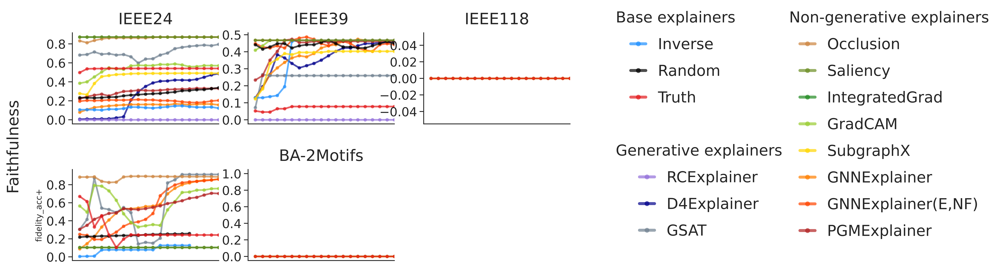

In [26]:
df = df_hard[['dataset', 'model', 'explainer', 'seed', 'topk', 'balanced_acc', 'roc_auc_score', 'f1_score', 'fidelity_acc+', 'fidelity_acc-', 'fidelity_prob+', 'fidelity_prob-']]
df = df.groupby(['model', 'dataset', 'explainer', 'topk']).mean().reset_index()
metric = "fidelity_acc+"
df[metric] = pd.to_numeric(df[metric], errors='coerce')


#sns.set_style("whitegrid")
sns.set_style("ticks")
sns.set_context("notebook", rc={"xtick.labelsize" : 18, "ytick.labelsize" : 18})
fonttitle = 23
fontlegend = 22
fig, ax = plt.subplots(2,3, sharex=True,sharey=False, figsize=(13,6), gridspec_kw={'hspace': 0.5})

g0 = sns.lineplot(data=df[df.dataset=='IEEE24'], x="topk", y=metric,
    hue="explainer", palette=dict_color, alpha=0.7, marker='o', markersize=5, markeredgewidth=0, lw=2.5, ax=ax[0,0])
g0.set_title('IEEE24', fontsize=fonttitle, y=1.05)
g0.set(xlabel=None, ylabel=None)
ax[0,0].legend([],[], frameon=False)
ax[0,0].set_xticks([])
ax[0,0].set_xlim(0,20)

g1 = sns.lineplot(data=df[df.dataset=='IEEE39'], x="topk", y=metric,
    hue="explainer", palette=dict_color, alpha=0.7, marker='o', markersize=5, markeredgewidth=0, lw=2.5, ax=ax[0,1])
g1.set_title('IEEE39', fontsize=fonttitle, y=1.05)
g1.set(xlabel=None, ylabel=None)
ax[0,1].legend([],[], frameon=False)
ax[0,1].set_xticks([])
ax[0,1].set_xlim(0,20)

g0 = sns.lineplot(data=df[df.dataset=='UK'], x="topk", y=metric,
    hue="explainer", palette=dict_color, alpha=0.7, marker='o', markersize=5, markeredgewidth=0, lw=2.5, ax=ax[1,0])
g3.set_title('UK', fontsize=fonttitle, y=1.05)
g3.set(xlabel=None, ylabel=None)
ax[1,0].legend([],[], frameon=False)
ax[1,0].set_xticks([])
ax[1,0].set_xlim(0,20)

g4 = sns.lineplot(data=df[df.dataset=='BA-2Motifs'], x="topk", y=metric,
    hue="explainer", palette=dict_color, alpha=0.7, marker='o', markersize=5, markeredgewidth=0, lw=2.5, ax=ax[1,1])
g4.set_title("BA-2Motifs", fontsize=fonttitle, y=1.05)
g4.set(xlabel=None, ylabel=None)
ax[1,1].legend([],[], frameon=False)
ax[1,1].set_xticks([])
ax[1,1].set_xlim(0,20)

g5 = sns.lineplot(data=df[df.dataset=='IEEE118'], x="topk", y=metric,
    hue="explainer", palette=dict_color, alpha=0.7, marker='o', markersize=5, markeredgewidth=0, lw=2.5, ax=ax[0,2])
g5.set_title("IEEE118", fontsize=fonttitle, y=1.05)
g5.set(xlabel=None, ylabel=None)
ax[0,2].legend([],[], frameon=False)
ax[0,2].set_xticks([])
ax[0,2].set_xlim(0,20)

# Remove the empty subplot (1, 2)
plt.delaxes(ax[1, 2])

#fig.supxlabel("Fraction of removed edges", fontsize=fonttitle, x=0.453, y=0.05)
fig.supylabel("Faithfulness", fontsize=fonttitle)

inv_dict_names = {v: k for k, v in dict_names.items()}

labels_base, handles_base = [], []
labels_gen, handles_gen = [], []
labels_non_gen, handles_non_gen = [], []
for handle, label in zip(*ax[0,0].get_legend_handles_labels()):
  if explainer_generation_str(inv_dict_names[label])=='generative':
    labels_gen.append(label)
    handles_gen.append(handle)
  elif explainer_generation_str(inv_dict_names[label])=='baseline':
    labels_base.append(label)
    handles_base.append(handle)
  else:
    labels_non_gen.append(label)
    handles_non_gen.append(handle)

labels_base, handles_base = zip(*sorted(zip(labels_base, handles_base), key=lambda t: t[0]))

nongen_keys=dict(zip(nongen_order,range(len(nongen_order))))
labels_non_gen, handles_non_gen = zip(*sorted(zip(labels_non_gen, handles_non_gen), key=lambda t,keys=nongen_keys: keys.get(t[0],np.inf))) # sort both labels and handles by labels

gen_keys=dict(zip(gen_order,range(len(gen_order))))
labels_gen, handles_gen = zip(*sorted(zip(labels_gen, handles_gen), key=lambda t,keys=gen_keys: keys.get(t[0],np.inf)))

leg_base = fig.legend(handles_base, labels_base, loc='upper left', ncol=1, fontsize=fontlegend, bbox_to_anchor=(0.95, 1), handlelength=1, title="Base explainers", title_fontsize=fontlegend, labelspacing = 0.8, frameon=False, markerscale=1.4)
leg_gen = fig.legend(handles_gen, labels_gen, loc='upper left', ncol=1, fontsize=fontlegend, bbox_to_anchor=(0.95, 0.55), handlelength=1, title="Generative explainers", title_fontsize=fontlegend, labelspacing = 0.8, frameon=False, markerscale=1.4)
leg_non_gen = fig.legend(handles_non_gen, labels_non_gen, loc='upper left', ncol=1, fontsize=fontlegend, bbox_to_anchor=(1.22, 1), handlelength=1, title="Non-generative explainers", title_fontsize=fontlegend, labelspacing = 0.8, frameon=False, markerscale=1.4)
for line in leg_base.get_lines():
    line.set_linewidth(4.3)
for line in leg_gen.get_lines():
    line.set_linewidth(4.3)
for line in leg_non_gen.get_lines():
    line.set_linewidth(4.3)



# Set the number of y-axis ticks or use a locator
# For example, to set 6 ticks on each y-axis:
for row in ax:
    for axis in row:
        axis.yaxis.set_major_locator(plt.MaxNLocator(6))

sns.despine()
plt.tight_layout(pad=1.8)
#plt.savefig('/cluster/home/kamara/PowerGraph/figures/hard_fidelity+acc.pdf', bbox_inches='tight')
#plt.savefig('/cluster/home/kamara/PowerGraph/figures/hard_fidelity+acc.png', bbox_inches='tight')
plt.show()

In [28]:

df = df_hard[['dataset', 'model', 'explainer', 'seed', 'topk', 'balanced_acc', 'roc_auc_score', 'f1_score', 'fidelity_acc+', 'fidelity_acc-', 'fidelity_prob+', 'fidelity_prob-']]
df = df.groupby(['model', 'dataset', 'explainer', 'topk']).mean().reset_index()
metric = "fidelity_prob+"
df[metric] = pd.to_numeric(df[metric], errors='coerce')

sns.set_style("ticks")
sns.set_context("notebook", rc={"xtick.labelsize" : 18, "ytick.labelsize" : 18})
fonttitle = 23
fontlegend = 22

fig, ax = plt.subplots(2,2, sharex=True,sharey=False, figsize=(12,8))

g2 = sns.lineplot(data=df[df.dataset=='IEEE24'], x="topk", y=metric,
    hue="explainer", palette=dict_color, alpha=0.7, marker='o', markersize=5, markeredgewidth=0, lw=2.5, ax=ax[0,0])#ax[1,0])
g2.set_title("IEEE24", fontsize=fonttitle, y=1.05)
g2.set(xlabel=None, ylabel=None)
ax[0,0].legend([],[], frameon=False)
ax[0,0].set_xlim(0,20)

g3 = sns.lineplot(data=df[df.dataset=='IEEE39'], x="topk", y=metric,
    hue="explainer", palette=dict_color, alpha=0.7, marker='o', markersize=5, markeredgewidth=0, lw=2.5, ax=ax[1,0])#ax[1,1])
g3.set_title('IEEE39', fontsize=fonttitle, y=1.05)
g3.set(xlabel=None, ylabel=None)
ax[1,0].legend([],[], frameon=False)
ax[1,0].set_xlim(0,20)

g4 = sns.lineplot(data=df[df.dataset=='UK'], x="topk", y=metric,
    hue="explainer", palette=dict_color, alpha=0.7, marker='o', markersize=5, markeredgewidth=0, lw=2.5, ax=ax[0,1])#ax[0,2])
g4.set_title("UK", fontsize=fonttitle, y=1.05)
g4.set(xlabel=None, ylabel=None)
ax[0,1].legend([],[], frameon=False)
ax[0,1].set_xlim(0,20)

g5 = sns.lineplot(data=df[df.dataset=='IEEE118'], x="topk", y=metric,
    hue="explainer", palette=dict_color, alpha=0.7, marker='o', markersize=5, markeredgewidth=0, lw=2.5, ax=ax[1,1])#ax[1,2])
g5.set_title('IEEE118', fontsize=fonttitle, y=1.05)
g5.set(xlabel=None, ylabel=None)
ax[1,1].legend([],[], frameon=False)
ax[1,1].set_xlim(0,20)

fig.supxlabel("Top K edges", fontsize=fonttitle, x=0.53, y=0.05)
fig.supylabel(f"Fidelity+ Acc", fontsize=fonttitle)

inv_dict_names = {v: k for k, v in dict_names.items()}

labels_base, handles_base = [], []
labels_gen, handles_gen = [], []
labels_non_gen, handles_non_gen = [], []
for handle, label in zip(*ax[1,0].get_legend_handles_labels()):
  if explainer_generation_str(inv_dict_names[label])=='generative':
    labels_gen.append(label)
    handles_gen.append(handle)
  elif explainer_generation_str(inv_dict_names[label])=='baseline':
    labels_base.append(label)
    handles_base.append(handle)
  else:
    labels_non_gen.append(label)
    handles_non_gen.append(handle)


labels_base, handles_base = zip(*sorted(zip(labels_base, handles_base), key=lambda t: t[0]))

nongen_keys=dict(zip(nongen_order,range(len(nongen_order))))
labels_non_gen, handles_non_gen = zip(*sorted(zip(labels_non_gen, handles_non_gen), key=lambda t,keys=nongen_keys: keys.get(t[0],np.inf))) # sort both labels and handles by labels

gen_keys=dict(zip(gen_order,range(len(gen_order))))
labels_gen, handles_gen = zip(*sorted(zip(labels_gen, handles_gen), key=lambda t,keys=gen_keys: keys.get(t[0],np.inf)))

leg_base = fig.legend(handles_base, labels_base, loc='upper left', ncol=1, fontsize=fontlegend, bbox_to_anchor=(1, 1), handlelength=1, title="Baselines", title_fontsize=fontlegend, labelspacing = 0.8, frameon=False, markerscale=1.4)
leg_gen = fig.legend(handles_gen, labels_gen, loc='upper left', ncol=1, fontsize=fontlegend, bbox_to_anchor=(1, 0.65), handlelength=1, title="Generative explainers", title_fontsize=fontlegend, labelspacing = 0.8, frameon=False, markerscale=1.4)
leg_non_gen = fig.legend(handles_non_gen, labels_non_gen, loc='upper left', ncol=1, fontsize=fontlegend, bbox_to_anchor=(1.3, 1), handlelength=1, title="Non-generative explainers", title_fontsize=fontlegend, labelspacing = 0.8, frameon=False, markerscale=1.4)
for line in leg_base.get_lines():
    line.set_linewidth(4.3)
for line in leg_gen.get_lines():
    line.set_linewidth(4.3)
for line in leg_non_gen.get_lines():
    line.set_linewidth(4.3)

leg_base._legend_box.align = "left"
leg_non_gen._legend_box.align = "left"
leg_gen._legend_box.align = "left"

sns.despine()
plt.tight_layout(pad=1.8)
plt.savefig(f'/cluster/home/kamara/PowerGraph/figures/hard_{metric}.pdf', bbox_inches='tight')
#plt.savefig(f'/cluster/home/kamara/PowerGraph/figures/hard_{metric}.png', bbox_inches='tight')
plt.show()

In [30]:
optim_topks = {"IEEE24": 8, "IEEE39":10, "IEEE118":6, "UK":10, "BA-2Motifs":11}

df = df_hard[['dataset', 'model', 'explainer', 'seed', 'topk', 'balanced_acc', 'roc_auc_score', 'f1_score', 'fidelity_acc+', 'fidelity_acc-', 'fidelity_prob+', 'fidelity_prob-']]
df = df.groupby(['model', 'dataset', 'explainer', 'topk']).mean().reset_index()
metric = "fidelity_prob+"
df[metric] = pd.to_numeric(df[metric], errors='coerce')


sns.set_style("ticks")
sns.set_context("notebook", rc={"xtick.labelsize" : 18, "ytick.labelsize" : 18})
fonttitle = 23
fontlegend = 22

fig, ax = plt.subplots(2,2, sharex=False,sharey=False, figsize=(16,7))

df0 = df[(df.dataset=='IEEE24')&(df.topk==optim_topks['IEEE24'])]
df0 = order_by(df0, metric)
g0 = sns.barplot(data=df0, x="topk", y=metric,
    hue="explainer", palette=dict_color, dodge=True, errorbar='se', ax=ax[0,0])
g0.set_title('IEEE24', fontsize=fonttitle, y=1.05)
g0.set(xlabel=None, ylabel=None)
ax[0,0].legend([],[], frameon=False)
ax[0,0].set_xticks([])
ax[0,0].text(0.75,0.8,r'$topk^{*} = 8$', fontsize=20, bbox =dict(facecolor=pal[0], edgecolor='black', linewidth=1, boxstyle='round,pad=0.4',alpha=0.3), transform=ax[0,0].transAxes)

df1 = df[(df.dataset=='IEEE39')&(df.topk==optim_topks['IEEE39'])]
df1 = order_by(df1, metric)
g1 = sns.barplot(data=df1, x="topk", y=metric,
    hue="explainer", palette=dict_color, dodge=True, errorbar='se', ax=ax[1,0])
g1.set_title('IEEE39', fontsize=fonttitle, y=1.05)
g1.set(xlabel=None, ylabel=None)
ax[1,0].legend([],[], frameon=False)
ax[1,0].set_xticks([])
ax[1,0].text(0.75,0.8,r'$topk^{*} = 10$', fontsize=20, bbox =dict(facecolor=pal[0], edgecolor='black', linewidth=1, boxstyle='round,pad=0.4',alpha=0.3), transform=ax[1,0].transAxes)


df2 = df[(df.dataset=='UK')&(df.topk==optim_topks['UK'])]
df2 = order_by(df2, metric)
g2 = sns.barplot(data=df2, x="topk", y=metric,
    hue="explainer", palette=dict_color, dodge=True, errorbar='se', ax=ax[0,1])
g2.set_title("UK", fontsize=fonttitle, y=1.05)
g2.set(xlabel=None, ylabel=None)
ax[0,1].legend([],[], frameon=False)
ax[0,1].set_xticks([])
ax[0,1].text(0.75,0.8,r'$topk^{*} = 10$', fontsize=20, bbox =dict(facecolor=pal[0], edgecolor='black', linewidth=1, boxstyle='round,pad=0.4',alpha=0.3), transform=ax[0,1].transAxes)


df3 = df[(df.dataset=='IEEE118')&(df.topk==optim_topks['IEEE118'])]
df3 = order_by(df3, metric)
g3 = sns.barplot(data=df3, x="topk", y=metric,
    hue="explainer", palette=dict_color, dodge=True, errorbar='se', ax=ax[1,1])
g3.set_title('IEEE118', fontsize=fonttitle, y=1.05)
g3.set(xlabel=None, ylabel=None)
ax[1,1].legend([],[], frameon=False)
ax[1,1].set_xticks([])
ax[1,1].text(0.75,0.8,r'$topk^{*} = 6$', fontsize=20, bbox =dict(facecolor=pal[0], edgecolor='black', linewidth=1, boxstyle='round,pad=0.4',alpha=0.3), transform=ax[1,1].transAxes)


#ax[1,2].set_visible(False)

#fig.supxlabel("Fraction of removed edges", fontsize=fonttitle, x=0.53, y=0.05)
fig.supylabel("Faithfulness at Optimal TopK", fontsize=fonttitle)

inv_dict_names = {v: k for k, v in dict_names.items()}

labels_base, handles_base = [], []
labels_gen, handles_gen = [], []
labels_non_gen, handles_non_gen = [], []
for handle, label in zip(*ax[0,0].get_legend_handles_labels()):
  if explainer_generation_str(inv_dict_names[label])=='generative':
    labels_gen.append(label)
    handles_gen.append(handle)
  elif explainer_generation_str(inv_dict_names[label])=='baseline':
    labels_base.append(label)
    handles_base.append(handle)
  else:
    labels_non_gen.append(label)
    handles_non_gen.append(handle)

labels_base, handles_base = zip(*sorted(zip(labels_base, handles_base), key=lambda t: t[0]))

nongen_keys=dict(zip(nongen_order,range(len(nongen_order))))
labels_non_gen, handles_non_gen = zip(*sorted(zip(labels_non_gen, handles_non_gen), key=lambda t,keys=nongen_keys: keys.get(t[0],np.inf))) # sort both labels and handles by labels

gen_keys=dict(zip(gen_order,range(len(gen_order))))
labels_gen, handles_gen = zip(*sorted(zip(labels_gen, handles_gen), key=lambda t,keys=gen_keys: keys.get(t[0],np.inf)))

leg_base = fig.legend(handles_base, labels_base, loc='upper left', ncol=1, fontsize=fontlegend, bbox_to_anchor=(1, 1), handlelength=1, title="Base explainers", title_fontsize=fontlegend, labelspacing = 0.8, frameon=False, markerscale=1.4)
leg_gen = fig.legend(handles_gen, labels_gen, loc='upper left', ncol=1, fontsize=fontlegend, bbox_to_anchor=(1, 0.65), handlelength=1, title="Generative explainers", title_fontsize=fontlegend, labelspacing = 0.8, frameon=False, markerscale=1.4)
leg_non_gen = fig.legend(handles_non_gen, labels_non_gen, loc='upper left', ncol=1, fontsize=fontlegend, bbox_to_anchor=(1.22, 1), handlelength=1, title="Non-generative explainers", title_fontsize=fontlegend, labelspacing = 0.8, frameon=False, markerscale=1.4)
for line in leg_base.get_lines():
    line.set_linewidth(4.3)
for line in leg_gen.get_lines():
    line.set_linewidth(4.3)
for line in leg_non_gen.get_lines():
    line.set_linewidth(4.3)

sns.despine()
plt.tight_layout(pad=1.8)
plt.savefig(f'/cluster/home/kamara/PowerGraph/figures/hard_optim_{metric}.pdf', bbox_inches='tight')
#plt.savefig(f'/cluster/home/kamara/PowerGraph/figures/hard_optim_{metric}.png', bbox_inches='tight')
plt.show()

/tmp/ipykernel_1924/1108326277.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['explainer_rank'] = df['explainer'].apply(lambda x: expl_order.index(x))
/tmp/ipykernel_1924/1108326277.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['explainer_rank'] = df['explainer'].apply(lambda x: expl_order.index(x))
/tmp/ipykernel_1924/1108326277.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the 

In [32]:
optim_topks = {"IEEE24": 8, "IEEE39":10, "IEEE118":6, "UK":10, "BA-2Motifs":11}

df = df_hard[['dataset', 'model', 'explainer', 'seed', 'topk', 'balanced_acc', 'roc_auc_score', 'f1_score', 'fidelity_acc+', 'fidelity_acc-', 'fidelity_prob+', 'fidelity_prob-']]
df = df.groupby(['model', 'dataset', 'explainer', 'topk']).mean().reset_index()
metric = "fidelity_prob+"
df[metric] = pd.to_numeric(df[metric], errors='coerce')


sns.set_style("ticks")
sns.set_context("notebook", rc={"xtick.labelsize" : 18, "ytick.labelsize" : 18})
fonttitle = 23
fontlegend = 22

fig, ax = plt.subplots(2,3, sharex=False,sharey=False, figsize=(20,7))

df0 = df[(df.dataset=='IEEE24')&(df.topk==optim_topks['IEEE24'])]
df0 = order_by(df0, metric)
g0 = sns.barplot(data=df0, x="topk", y=metric,
    hue="explainer", palette=dict_color, dodge=True, errorbar='se', ax=ax[0,0])
g0.set_title('IEEE24', fontsize=fonttitle, y=1.05)
g0.set(xlabel=None, ylabel=None)
ax[0,0].legend([],[], frameon=False)
ax[0,0].set_xticks([])
ax[0,0].text(0.75,0.8,r'$topk^{*} = 8$', fontsize=20, bbox =dict(facecolor=pal[0], edgecolor='black', linewidth=1, boxstyle='round,pad=0.4',alpha=0.3), transform=ax[0,0].transAxes)

df1 = df[(df.dataset=='IEEE39')&(df.topk==optim_topks['IEEE39'])]
df1 = order_by(df1, metric)
g1 = sns.barplot(data=df1, x="topk", y=metric,
    hue="explainer", palette=dict_color, dodge=True, errorbar='se', ax=ax[1,0])
g1.set_title('IEEE39', fontsize=fonttitle, y=1.05)
g1.set(xlabel=None, ylabel=None)
ax[1,0].legend([],[], frameon=False)
ax[1,0].set_xticks([])
ax[1,0].text(0.75,0.8,r'$topk^{*} = 10$', fontsize=20, bbox =dict(facecolor=pal[0], edgecolor='black', linewidth=1, boxstyle='round,pad=0.4',alpha=0.3), transform=ax[1,0].transAxes)


df2 = df[(df.dataset=='UK')&(df.topk==optim_topks['UK'])]
df2 = order_by(df2, metric)
g2 = sns.barplot(data=df2, x="topk", y=metric,
    hue="explainer", palette=dict_color, dodge=True, errorbar='se', ax=ax[0,1])
g2.set_title("UK", fontsize=fonttitle, y=1.05)
g2.set(xlabel=None, ylabel=None)
ax[0,1].legend([],[], frameon=False)
ax[0,1].set_xticks([])
ax[0,1].text(0.75,0.8,r'$topk^{*} = 10$', fontsize=20, bbox =dict(facecolor=pal[0], edgecolor='black', linewidth=1, boxstyle='round,pad=0.4',alpha=0.3), transform=ax[0,1].transAxes)


df3 = df[(df.dataset=='IEEE118')&(df.topk==optim_topks['IEEE118'])]
df3 = order_by(df3, metric)
g3 = sns.barplot(data=df3, x="topk", y=metric,
    hue="explainer", palette=dict_color, dodge=True, errorbar='se', ax=ax[1,1])
g3.set_title('IEEE118', fontsize=fonttitle, y=1.05)
g3.set(xlabel=None, ylabel=None)
ax[1,1].legend([],[], frameon=False)
ax[1,1].set_xticks([])
ax[1,1].text(0.75,0.8,r'$topk^{*} = 6$', fontsize=20, bbox =dict(facecolor=pal[0], edgecolor='black', linewidth=1, boxstyle='round,pad=0.4',alpha=0.3), transform=ax[1,1].transAxes)


df4 = df[(df.dataset=='BA-2Motifs')&(df.topk==optim_topks['BA-2Motifs'])]
df4 = order_by(df4, metric)
g4 = sns.barplot(data=df4, x="topk", y=metric,
    hue="explainer", palette=dict_color, dodge=True, errorbar='se', ax=ax[0,2])
g4.set_title('BA-2Motifs', fontsize=fonttitle, y=1.05)
g4.set(xlabel=None, ylabel=None)
ax[0,2].legend([],[], frameon=False)
ax[0,2].set_xticks([])
ax[0,2].text(0.75,0.8,r'$topk^{*} = 10$', fontsize=20, bbox =dict(facecolor=pal[0], edgecolor='black', linewidth=1, boxstyle='round,pad=0.4',alpha=0.3), transform=ax[0,2].transAxes)

#ax[1,2].set_visible(False)

#fig.supxlabel("Fraction of removed edges", fontsize=fonttitle, x=0.53, y=0.05)
fig.supylabel("Faithfulness at Optimal TopK", fontsize=fonttitle)

inv_dict_names = {v: k for k, v in dict_names.items()}

labels_base, handles_base = [], []
labels_gen, handles_gen = [], []
labels_non_gen, handles_non_gen = [], []
for handle, label in zip(*ax[0,0].get_legend_handles_labels()):
  if explainer_generation_str(inv_dict_names[label])=='generative':
    labels_gen.append(label)
    handles_gen.append(handle)
  elif explainer_generation_str(inv_dict_names[label])=='baseline':
    labels_base.append(label)
    handles_base.append(handle)
  else:
    labels_non_gen.append(label)
    handles_non_gen.append(handle)

labels_base, handles_base = zip(*sorted(zip(labels_base, handles_base), key=lambda t: t[0]))

nongen_keys=dict(zip(nongen_order,range(len(nongen_order))))
labels_non_gen, handles_non_gen = zip(*sorted(zip(labels_non_gen, handles_non_gen), key=lambda t,keys=nongen_keys: keys.get(t[0],np.inf))) # sort both labels and handles by labels

gen_keys=dict(zip(gen_order,range(len(gen_order))))
labels_gen, handles_gen = zip(*sorted(zip(labels_gen, handles_gen), key=lambda t,keys=gen_keys: keys.get(t[0],np.inf)))

leg_base = fig.legend(handles_base, labels_base, loc='upper left', ncol=1, fontsize=fontlegend, bbox_to_anchor=(1, 1), handlelength=1, title="Base explainers", title_fontsize=fontlegend, labelspacing = 0.8, frameon=False, markerscale=1.4)
leg_gen = fig.legend(handles_gen, labels_gen, loc='upper left', ncol=1, fontsize=fontlegend, bbox_to_anchor=(1, 0.65), handlelength=1, title="Generative explainers", title_fontsize=fontlegend, labelspacing = 0.8, frameon=False, markerscale=1.4)
leg_non_gen = fig.legend(handles_non_gen, labels_non_gen, loc='upper left', ncol=1, fontsize=fontlegend, bbox_to_anchor=(1.22, 1), handlelength=1, title="Non-generative explainers", title_fontsize=fontlegend, labelspacing = 0.8, frameon=False, markerscale=1.4)
for line in leg_base.get_lines():
    line.set_linewidth(4.3)
for line in leg_gen.get_lines():
    line.set_linewidth(4.3)
for line in leg_non_gen.get_lines():
    line.set_linewidth(4.3)

sns.despine()
plt.tight_layout(pad=1.8)
#plt.savefig(f'/cluster/home/kamara/PowerGraph/figures/hard_optim_{metric}.pdf', bbox_inches='tight')
#plt.savefig(f'/cluster/home/kamara/PowerGraph/figures/hard_optim_{metric}.png', bbox_inches='tight')
plt.show()

/tmp/ipykernel_1924/1108326277.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['explainer_rank'] = df['explainer'].apply(lambda x: expl_order.index(x))
/tmp/ipykernel_1924/1108326277.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['explainer_rank'] = df['explainer'].apply(lambda x: expl_order.index(x))
/tmp/ipykernel_1924/1108326277.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the 